In [4]:
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pertpy as pt
import warnings
from matplotlib import rcParams
from gprofiler import GProfiler
from tqdm import tqdm
import torch
from pathlib import Path 


rcParams['figure.dpi'] = 100
FIGSIZE=(3,3)               
rcParams['figure.figsize']=FIGSIZE

**Util functions**

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.pyplot as plt
import seaborn as sns

def plot_umap_with_compound_and_batch(adata, compound_category='compound', batch_category='batch', target_compound='UNTREATED', dim_red="umap"):
    """
    Plot UMAP with points colored based on compound category and batch.
    
    Parameters:
        adata (Anndata): Annotated data object containing precomputed UMAP coordinates.
        compound_category (str): Name of the compound category column in adata.obs.
        batch_category (str): Name of the batch category column in adata.obs.
        target_compound (str): Compound to highlight, others will be grey.
    """
    # Create color palette based on unique combinations of compound and batch
    unique_combinations = adata.obs[[compound_category, batch_category]].drop_duplicates()
    unique_combinations = unique_combinations.loc[unique_combinations[compound_category]==target_compound].sort_values(by="batch")
    palette = sns.color_palette("colorblind", n_colors=len(unique_combinations))
    colors = dict(zip(unique_combinations.apply(tuple, axis=1), palette))

    # Plot all points in grey
    np.random.seed(13)
    plt.figure(figsize=(3,3))
    plt.scatter(adata.obsm[f'X_{dim_red}'][:, 0], adata.obsm[f'X_{dim_red}'][:, 1], color='grey', alpha=0.5, label='Other', s=5)
    
    # Plot points colored by compound and batch
    for idx, (compound, batch) in enumerate(unique_combinations.values):
        indices = (adata.obs[compound_category] == compound) & (adata.obs[batch_category] == batch)
        if compound == target_compound:
            plt.scatter(adata.obsm[f'X_{dim_red}'][indices, 0], adata.obsm[f'X_{dim_red}'][indices, 1], 
                        color=colors[(compound, batch)], label=f'{compound} batch {batch.replace("0","")}', s=8)

    plt.title(f'UMAP colored by {compound_category} and {batch_category}')
    plt.xlabel(f'{dim_red} 1')
    plt.ylabel(f'{dim_red} 2')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show()

def differentially_enriched_paths(clus1, clus2):
    clus1 = clus1.set_index("name")
    clus2 = clus2.set_index("name")
    intersected = np.intersect1d(clus1.index, clus2.index)
    diff = np.setdiff1d(clus1.index, clus2.index)
    clus1_intersected = clus1.loc[intersected]
    clus2_intersected = clus2.loc[intersected]
    return -np.log10(clus1_intersected["p_value"]/clus2_intersected["p_value"]).sort_values(), diff

**Read data**

In [6]:
path_before_correction = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_before_transf.h5ad" 
path_after_correction = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_after_transf.h5ad"

In [7]:
adata_before_correction = sc.read_h5ad(path_before_correction)
adata_after_correction = sc.read_h5ad(path_after_correction)

In [8]:
data_index = pd.read_csv('/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1/metadata/rxrx1_df.csv', index_col=1)
compound_names = []

for row in adata_before_correction.obs.iterrows():
    batch = row[1].batch
    plate = row[1].plate
    well = row[1].well
    view = row[1]["view"]
    no = row[1].no
    file_name = f"U2OS-{batch}_{plate}_{well}_{view}_{no}"
    cpd = data_index.loc[file_name].CPD_NAME
    compound_names.append(cpd)
    
adata_before_correction.obs["compound"] = compound_names
adata_after_correction.obs["compound"] = compound_names

Original

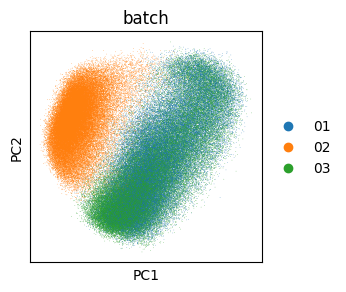

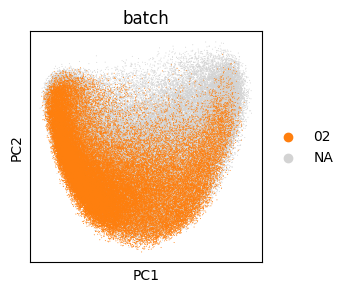

In [39]:
sc.pl.pca(adata_before_correction, color="batch")
sc.pl.pca(adata_after_correction, color="batch", groups="02", size=2)

In [10]:
for i in np.unique(data_index.CPD_NAME):
    print(i)

A4GALT
A4GNT
ABCA7
ABCA9
ABCC4
ABHD1
ABHD11
ABHD14B
ABI1
ABI3
ABLIM2
ACAA2
ACAD10
ACCS
ACOT2
ACSBG2
ACSS1
ACTL7B
ACTR5
ACTRT3
ADAP1
ADIPOR1
AGBL2
AGBL4
AGMAT
AGPAT2
AGR2
AHCYL1
AHSA1
AKAP3
AKAP9
AKR1A1
AKR1E2
ALDH1L1
ALG3
ALG9
ALYREF
AMDHD2
AMMECR1
ANAPC10
ANAPC11
ANAPC7
ANGPT4
ANGPTL4
ANGPTL6
ANKIB1
ANTXR1
AP5Z1
APC2
APH1A
APH1B
APIP
APOBEC2
APOL3
APOL4
APOL5
APPBP2
APTX
AREL1
ARFGAP2
ARHGAP10
ARHGAP11A
ARHGAP25
ARID3B
ARIH2
ARL14
ARL15
ARL6
ARL6IP5
ARMCX2
ARPC1A
ARPC5L
ARSJ
ASAP1
ASCC1
ASCC3
ASPN
ATF7
ATG13
ATG7
ATL1
ATP2C1
ATP5H
ATP6AP2
ATP6V0A4
ATP6V1H
ATP8A2
ATP8B4
AZIN1
B3GALT5
B3GNT2
B3GNT3
BAIAP2
BASP1
BCAS2
BCL11A
BCL7B
BCO2
BICC1
BLM
BMS1
BNC2
BPIFA1
BRD8
BRIP1
BTBD1
BTBD10
BTN2A3P
BTN3A3
BTNL3
BZW1
C14orf2
C1D
C1orf61
C2CD2L
C2CD5
CALCOCO2
CALY
CAP1
CAP2
CARD11
CARD6
CARM1
CARTPT
CBLL1
CBR4
CBX1
CCL26
CCL27
CCNI
CCNO
CCP110
CD244
CD2BP2
CD83
CDADC1
CDC42EP2
CDHR2
CDHR5
CDIPT
CDK2AP2
CDON
CECR1
CELF1
CEP104
CEP57
CEPT1
CFDP1
CFTR
CHAF1A
CHD9
CHERP
CHL1
CHMP6
CHPF2
CHRAC1
CHST

# CONTROLS

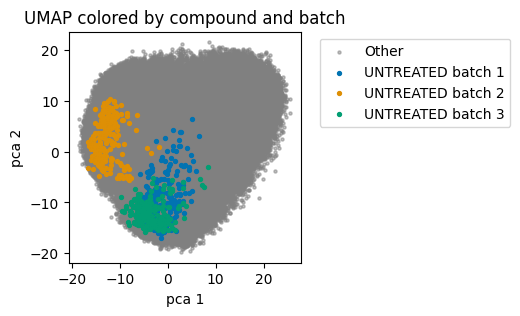

In [11]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "UNTREATED", dim_red="pca")

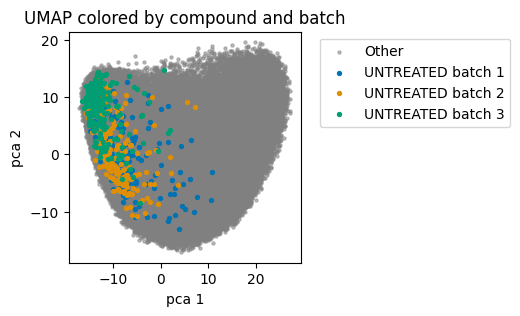

In [12]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "UNTREATED", dim_red="pca")

# Strong Perturbations

EPHX3

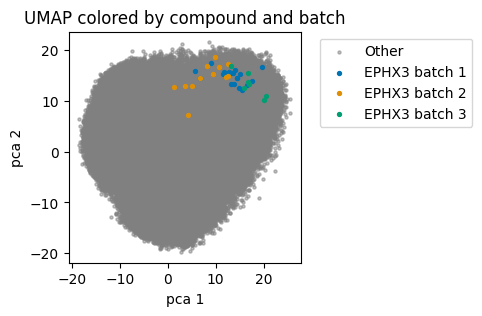

In [13]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "EPHX3", dim_red="pca")

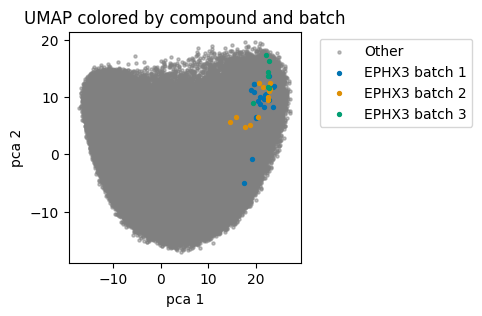

In [14]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "EPHX3", dim_red="pca")

A4GALT

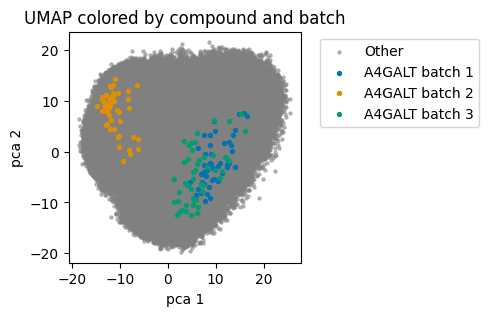

In [15]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "A4GALT", dim_red="pca")

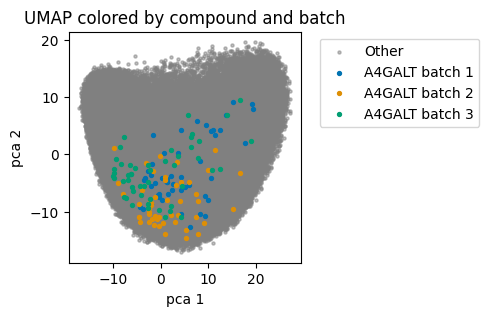

In [16]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "A4GALT", dim_red="pca")

TSFM

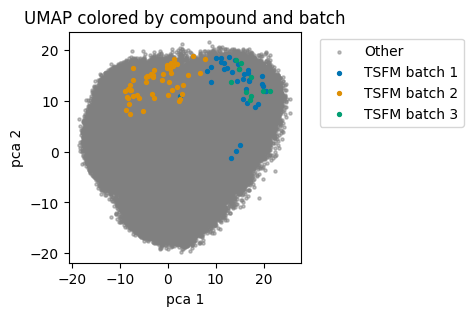

In [17]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "TSFM", dim_red="pca")

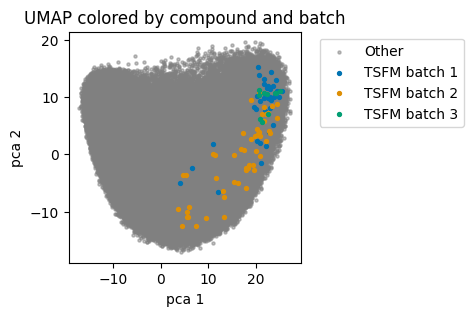

In [18]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "TSFM", dim_red="pca")

SNTG2

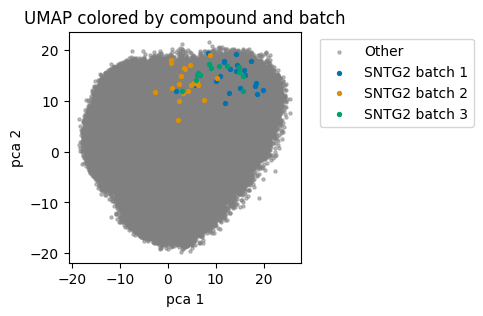

In [19]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "SNTG2", dim_red="pca")

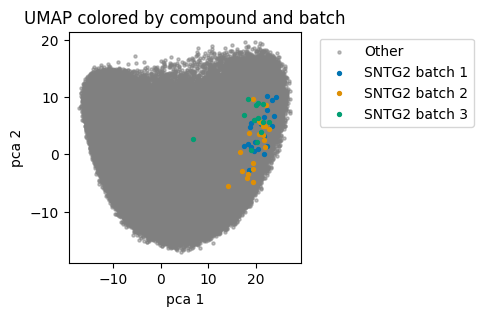

In [20]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "SNTG2", dim_red="pca")

NAA15

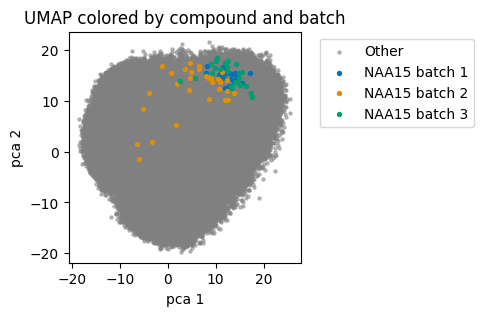

In [21]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "NAA15", dim_red="pca")

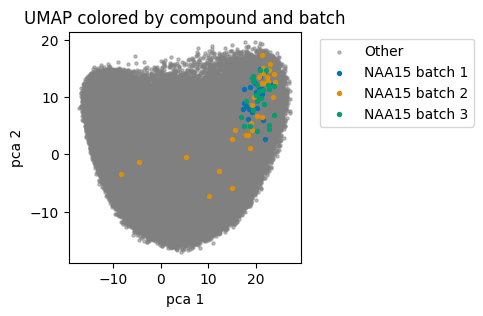

In [22]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "NAA15", dim_red="pca")

NXF1

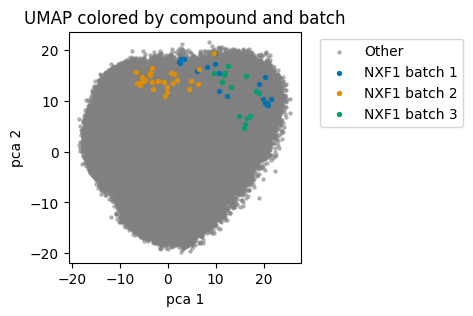

In [23]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "NXF1", dim_red="pca")

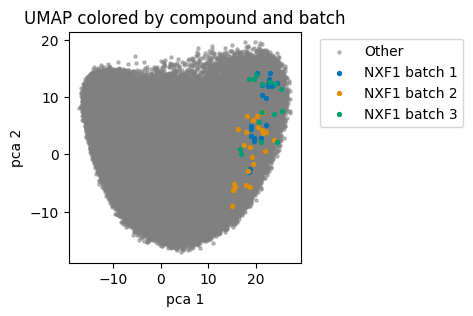

In [24]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "NXF1", dim_red="pca")

GATAD2A

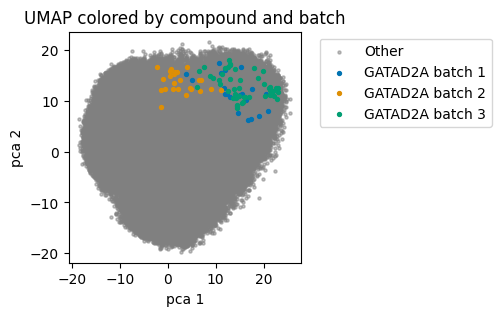

In [25]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "GATAD2A", dim_red="pca")

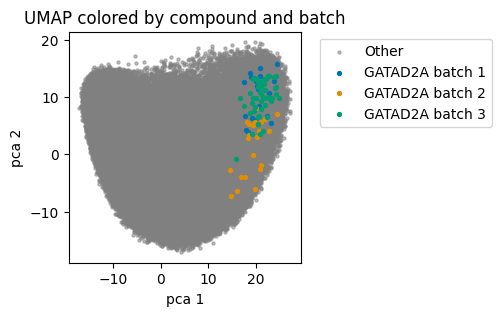

In [26]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "GATAD2A", dim_red="pca")

TTN	

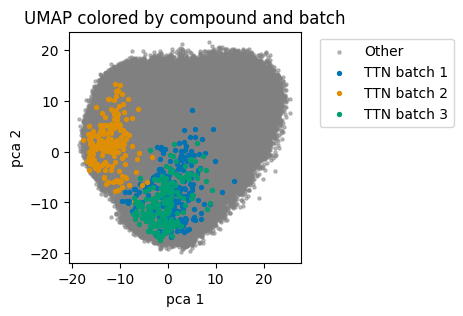

In [27]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "TTN", dim_red="pca")

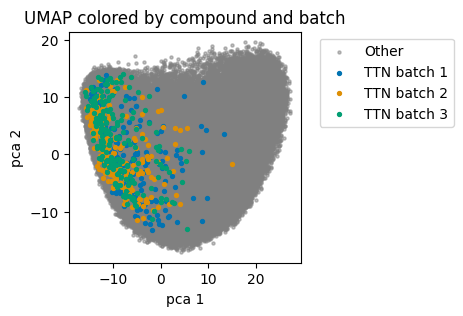

In [28]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "TTN", dim_red="pca")

Louvain before and after correction 
- clusters you recover?
- after clustering corresponds to that mode of action
- Show correction data above and bio below 

NIPBL	

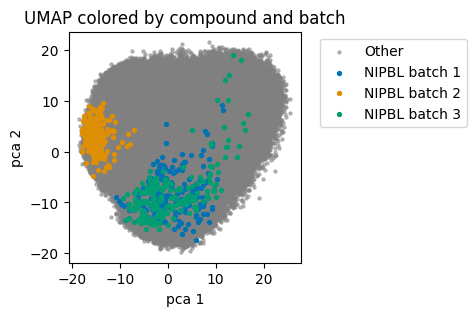

In [29]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "NIPBL", dim_red="pca")

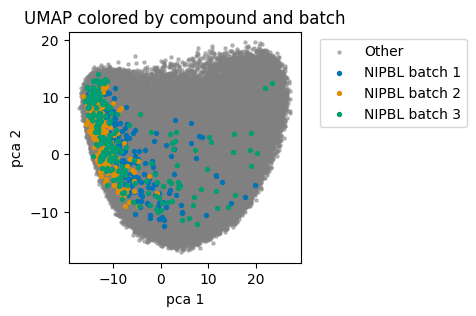

In [30]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "NIPBL", dim_red="pca")

GRN	

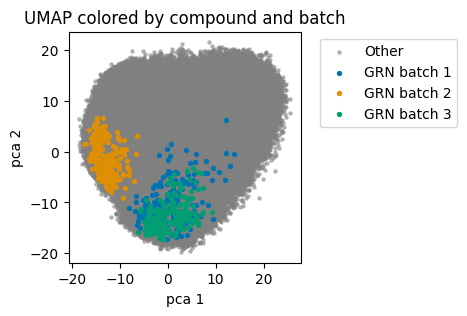

In [31]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "GRN", dim_red="pca")

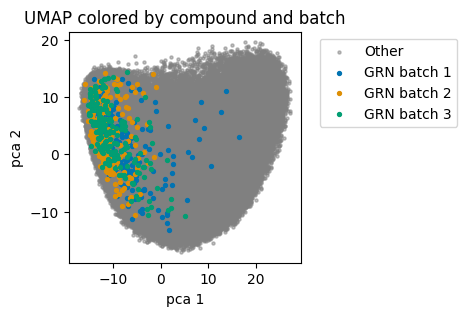

In [32]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "GRN", dim_red="pca")

CYP27A1

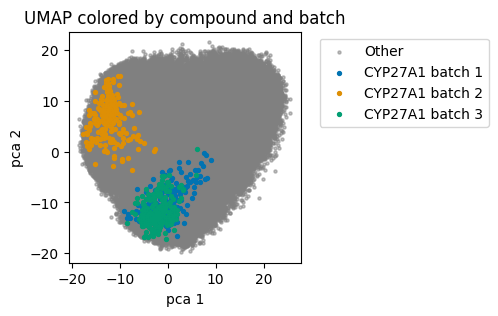

In [33]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "CYP27A1", dim_red="pca")

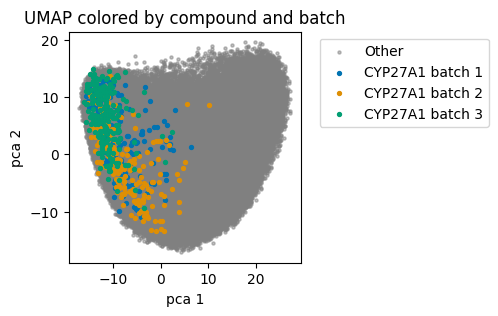

In [34]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "CYP27A1", dim_red="pca")

Variable

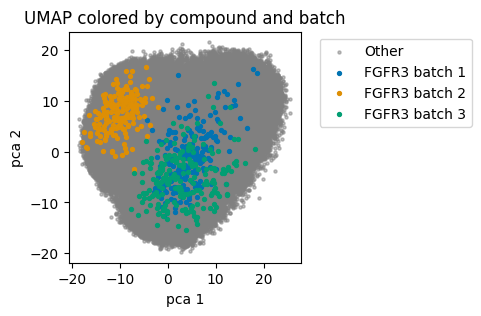

In [35]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "FGFR3", dim_red="pca")

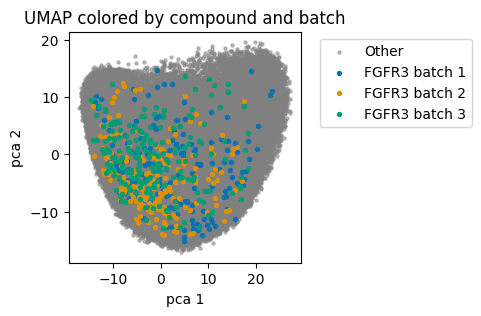

In [36]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "FGFR3", dim_red="pca")

# LEIDEN cluster

In [39]:
FIGSIZE=(5,5)               
rcParams['figure.figsize']=FIGSIZE

In [40]:
# sc.tl.leiden(adata_after_correction)

In [41]:
# sc.tl.leiden(adata_before_correction)

In [42]:
# adata_after_correction.write_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_after_transf_leiden.h5ad")
adata_after_correction = sc.read_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_after_transf_leiden.h5ad")
adata_after_correcton_scpoli = sc.read_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_after_transf_leiden.h5ad")

cluster_type = []
for i in adata_after_correction.obs.leiden:
    if i in ["9",  "11"]:
        cluster_type.append("active")
    elif i in ["1", "6", "5"]:
        cluster_type.append("inactive")
    else:
        cluster_type.append("other")

adata_after_correction.obs["cluster_type"] = cluster_type

In [43]:
adata_after_correction

AnnData object with n_obs × n_vars = 170943 × 384
    obs: 'batch', 'plate', 'well', 'view', 'no', 'compound', 'leiden', 'cluster_type'
    uns: 'batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [44]:
# adata_before_correction.write_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_before_transf_leiden.h5ad")
adata_before_correction = sc.read_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_before_transf_leiden.h5ad")

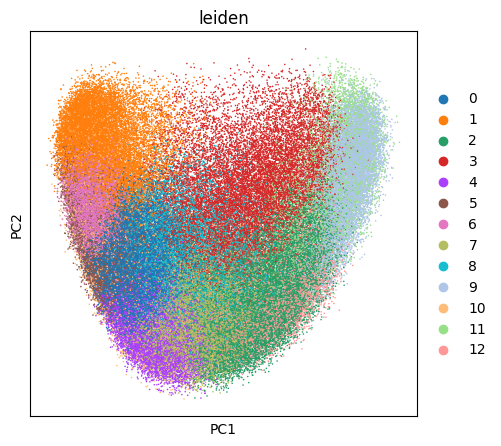

In [45]:
FIGSIZE=(8,8)    
groups = [str(i) for i in range(11)]
sc.pl.pca(adata_after_correction, color="leiden", s=5)

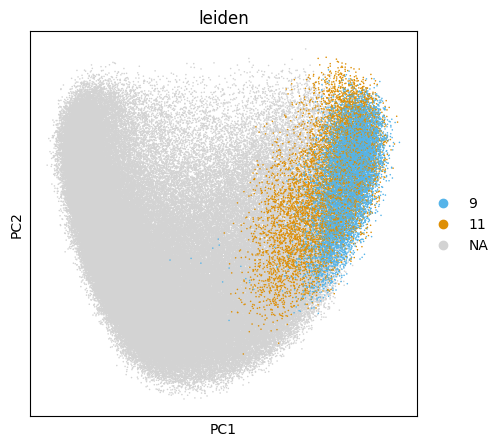

In [46]:
sc.pl.pca(adata_after_correction,  color="leiden", groups=["9",  "11"], s=5, palette=sns.color_palette("colorblind"))

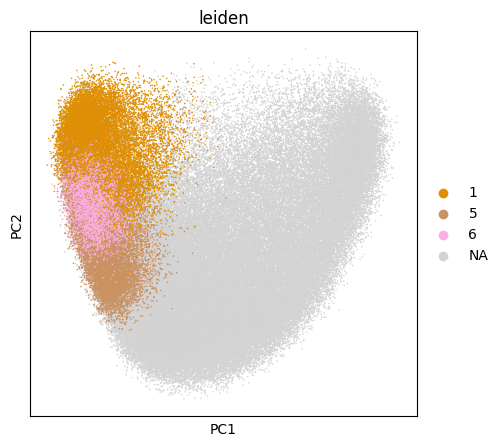

In [47]:
sc.pl.pca(adata_after_correction, color="leiden", groups=["1", "6", "5"], s=5, palette=sns.color_palette("colorblind"))

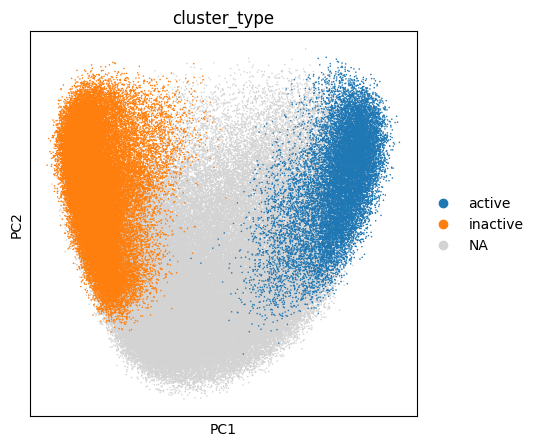

In [48]:
sc.pl.pca(adata_after_correction, color="cluster_type", groups=["active", "inactive"], s=5)

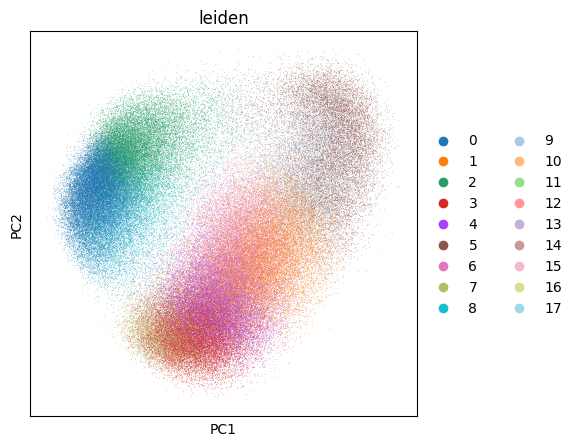

In [49]:
sc.pl.pca(adata_before_correction, color="leiden")

In [50]:
# # Find the cluster with largest amount of controls
# adata_after_correction_ctrl = adata_after_correction[adata_after_correction.obs.compound=="UNTREATED"]
# adata_after_correction_ctrl.obs["compunt_cluster"]

# np.unique(list(zip(adata_after_correction.obs.compound, adata_after_correction.obs.leiden)), return_counts=True)

In [51]:
for cluster in np.unique(adata_after_correction.obs["leiden"]):
    adata_cluster = adata_after_correction[adata_after_correction.obs.leiden==cluster]
    cpd_values = adata_cluster.obs.compound.value_counts()
    try:
        ctrl_frac = cpd_values["UNTREATED"]/cpd_values.sum()
        ctr_sum = cpd_values["UNTREATED"]
        print(f"For cluster {cluster}, control fraction is {ctrl_frac}")
        print(f"For cluster {cluster}, control sum is {ctr_sum}")
    except:
        print(f"No controls in cluster {cluster}")
        continue

For cluster 0, control fraction is 0.002913461100742022
For cluster 0, control sum is 64
For cluster 1, control fraction is 0.009670771019394387
For cluster 1, control sum is 183
For cluster 10, control fraction is 0.005300735612289053
For cluster 10, control sum is 49
No controls in cluster 11
No controls in cluster 12
For cluster 2, control fraction is 0.0006240426618256084
For cluster 2, control sum is 11
For cluster 3, control fraction is 0.00031587592393707753
For cluster 3, control sum is 5
For cluster 4, control fraction is 0.003218423687598341
For cluster 4, control sum is 45
For cluster 5, control fraction is 0.007400893969370557
For cluster 5, control sum is 101
For cluster 6, control fraction is 0.007553096021537541
For cluster 6, control sum is 101
For cluster 7, control fraction is 0.0003004356316659156
For cluster 7, control sum is 4
For cluster 8, control fraction is 0.0032320055904961563
For cluster 8, control sum is 37
No controls in cluster 9


## Compute cluster purity

In [52]:
def compute_purity_scores(adata, metric='entropy'):
    """
    Compute batch and compound purity scores for each cluster.

    Args:
    adata (AnnData): Annotated data object containing cluster, batch, and compound annotations.
    metric (str): 'entropy' or 'gini' to specify the purity metric to use (default is 'entropy').

    Returns:
    pd.DataFrame: DataFrame containing purity scores for each cluster.
                  Columns: cluster, batch_purity, compound_purity
    """

    # Extract cluster, batch, and compound annotations
    clusters = adata.obs['leiden']
    batches = adata.obs['batch']
    compounds = adata.obs['compound']

    # Create a DataFrame to store purity scores
    purity_df = pd.DataFrame(columns=['cluster', 'batch', 'compound'])

    # Iterate over each cluster
    for cluster in clusters.unique():
        # Filter data for the current cluster
        cluster_indices = clusters[clusters == cluster].index
        cluster_batches = batches.loc[cluster_indices]
        cluster_compounds = compounds.loc[cluster_indices]

        # Compute batch distribution
        batch_counts = cluster_batches.value_counts(normalize=True)
        # Compute compound distribution
        compound_counts = cluster_compounds.value_counts(normalize=True)

        # Compute batch purity using specified metric
        if metric == 'entropy':
            batch_purity = -np.sum(batch_counts * np.log2(batch_counts))
        elif metric == 'gini':
            batch_purity = 1 - np.sum(batch_counts ** 2)
        else:
            raise ValueError("Invalid metric. Please choose 'entropy' or 'gini' for batch purity.")

        # Compute compound purity using specified metric
        if metric == 'entropy':
            compound_purity = -np.sum(compound_counts * np.log2(compound_counts))
        elif metric == 'gini':
            compound_purity = 1 - np.sum(compound_counts ** 2)
        else:
            raise ValueError("Invalid metric. Please choose 'entropy' or 'gini' for compound purity.")

        # Add purity scores to DataFrame
        purity_df = purity_df.append({'cluster': cluster, 'batch': batch_purity, 'compound': compound_purity},
                                     ignore_index=True)

    return purity_df

Entropy

In [53]:
compute_purity_scores(adata_after_correction, metric="entropy").mean(0)

cluster     1.412023e+14
batch       1.182906e+00
compound    9.199185e+00
dtype: float64

In [54]:
compute_purity_scores(adata_before_correction, metric="entropy").mean(0)

cluster     3.946458e+24
batch       4.326539e-01
compound    5.607977e+00
dtype: float64

In [55]:
compute_purity_scores(adata_after_correction, metric="gini").mean(0)

cluster     1.412023e+14
batch       5.002087e-01
compound    9.975763e-01
dtype: float64

In [56]:
compute_purity_scores(adata_before_correction, metric="gini").mean(0)

cluster     3.946458e+24
batch       2.065607e-01
compound    6.468957e-01
dtype: float64

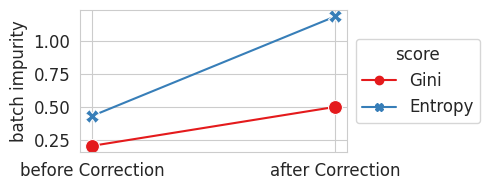

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Impurity scores before and after correction
gini_scores = [2.065607e-01, 5.002087e-01]
entropy_scores = [4.326539e-01, 1.182906e+00]

# Labels for before and after correction
labels = ['before Correction', 'after Correction']

# Create a dataframe for seaborn
import pandas as pd
data = pd.DataFrame({
    'Impurity': ['Gini', 'Gini', 'Entropy', 'Entropy'],
    'Score': gini_scores + entropy_scores,
    'Correction': labels * 2
})

# Plot using seaborn
sns.set_style("whitegrid")
plt.figure(figsize=(5, 2))
sns.lineplot(x='Correction',
             y='Score', 
             hue='Impurity',
             style='Impurity',
             markers=True, 
             dashes=False,
             data=data,
             marker='o', markersize=10, palette="Set1")

# Adding labels and title
plt.xlabel('', fontsize=12)
plt.ylabel('batch impurity', fontsize=12)
# plt.title('Impurity Scores Before and After Batch Correction', fontsize=16)
plt.xticks(fontsize=12, rotation=0)
plt.yticks(fontsize=12)
# plt.ylim(None, -0.3)
plt.legend(title='score', fontsize=12, title_fontsize=12, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()  # Ensures the legend doesn't get cut off
plt.savefig('/home/icb/alessandro.palma/environment/IMPA/IMPA/notebooks/cpg0000/plots/impurity_scores.svg', format='svg')  # Save as SVG image
plt.show()



## PER CLUSTER PATHWAY ANALYSIS

In [58]:
def pathway_enrichment_per_cluster(adata, cluster_column='leiden', gene_column="compound"):

    # Initialize dictionary to store pathway enrichment results
    pathway_enrichment_results = {}

    # Iterate over each cluster
    for cluster in tqdm(adata.obs[cluster_column].unique()):
        # Subset data for the current cluster
        cluster_data = adata[adata.obs[cluster_column] == cluster].copy()

        enrichment_results = sc.queries.enrich(list(np.unique(cluster_data.obs[gene_column])))

        # Store pathway enrichment results for the cluster
        pathway_enrichment_results[cluster] = enrichment_results

    return pathway_enrichment_results

In [59]:
enrichment_results_before_correction = pathway_enrichment_per_cluster(adata_before_correction, 
                                                                       cluster_column='leiden',
                                                                       gene_column="compound")

100%|██████████| 18/18 [00:50<00:00,  2.81s/it]


In [60]:
enrichment_results_after_correction = pathway_enrichment_per_cluster(adata_after_correction, 
                                                                       cluster_column='leiden',
                                                                       gene_column="compound")

100%|██████████| 13/13 [00:37<00:00,  2.85s/it]


Possible paths cluster 9:
* Golgi apparatus
* Golgi membrane
* endoplasmic reticulum subcompartment
* endoplasmic reticulum
* endoplasmic reticulum membrane

In [61]:
["9", "3", "2", "11", "12"]

['9', '3', '2', '11', '12']

In [62]:
enriched_9_1 = differentially_enriched_paths(enrichment_results_after_correction["9"], 
                              enrichment_results_after_correction["1"])
print(enriched_9_1[0][enriched_9_1[0]>0].index)
print(enriched_9_1[1])

Index(['kidney', 'kidney; cells in tubules[≥Low]',
       'glycoprotein biosynthetic process', 'nucleoplasm',
       'SWI/SNF superfamily-type complex', 'INO80-type complex', 'colon',
       'lung', 'glycosylation', 'Swr1 complex', 'ATPase complex', 'rectum',
       'intracellular protein-containing complex',
       'endoplasmic reticulum subcompartment',
       'skin 1; keratinocytes[≥Medium]', 'lung; macrophages[≥Low]',
       'protein modification by small protein conjugation or removal',
       'adrenal gland; glandular cells[≥Medium]',
       'post-translational protein modification',
       'nuclear outer membrane-endoplasmic reticulum membrane network',
       'urinary bladder', 'urinary bladder; urothelial cells[≥Low]',
       'transferase activity', 'stomach 2; glandular cells[≥Low]',
       'stomach 2'],
      dtype='object', name='name')
['ATP-dependent chromatin remodeling' 'appendix' 'breast'
 'breast; myoepithelial cells[≥Low]'
 'breast; myoepithelial cells[≥Medium]' 'cil

In [63]:
enriched_9_1[0]

name
kidney                                           3.502674
kidney; cells in tubules[≥Low]                   2.434885
glycoprotein biosynthetic process                2.092255
nucleoplasm                                      1.956082
SWI/SNF superfamily-type complex                 1.619181
                                                   ...   
cytosol                                         -3.955150
Factor: ZF5; motif: GGSGCGCGS; match class: 1   -3.999355
catalytic activity                              -5.583699
protein binding                                 -6.956146
cytoplasm                                       -8.223627
Name: p_value, Length: 69, dtype: float64

In [64]:
enriched_3_1 = differentially_enriched_paths(enrichment_results_after_correction["3"], 
                              enrichment_results_after_correction["1"])
print(enriched_3_1[0][enriched_3_1[0]>0].index)
print(enriched_3_1[1])

Index(['nucleoplasm', 'glycoprotein biosynthetic process',
       'membrane-bounded organelle', 'protein binding', 'kidney',
       'endomembrane system', 'endoplasmic reticulum subcompartment',
       'nuclear outer membrane-endoplasmic reticulum membrane network',
       'glycosylation', 'organelle subcompartment',
       'intracellular membrane-bounded organelle',
       'kidney; cells in tubules[≥Low]', 'endoplasmic reticulum',
       'endoplasmic reticulum membrane',
       'organonitrogen compound biosynthetic process', 'biological regulation',
       'cytoplasm', 'testis; Leydig cells[≥Medium]',
       'Factor: MAZ; motif: GGGMGGGGSSGGGGGGGGGGGG',
       'Factor: ETF; motif: CCCCGCCCCYN',
       'positive regulation of biological process', 'colon', 'organelle',
       'transferase activity', 'catalytic activity',
       'protein modification by small protein conjugation or removal',
       'organonitrogen compound metabolic process', 'acyltransferase activity',
       'post-tran

In [65]:
enriched_2_1 = differentially_enriched_paths(enrichment_results_after_correction["2"], 
                              enrichment_results_after_correction["1"])
print(enriched_2_1 [0][enriched_2_1 [0]>0].index)
print(enriched_2_1 [1])

Index(['kidney', 'colon', 'rectum', 'colon; glandular cells[≥Low]',
       'endomembrane system', 'kidney; cells in tubules[≥Low]',
       'protein binding', 'stomach 2', 'stomach 2; glandular cells[≥Low]',
       'parathyroid gland',
       ...
       'endometrium 2; glandular cells[≥Medium]',
       'positive regulation of biological process',
       'Asparagine N-linked glycosylation',
       'Factor: IRX-1; motif: NACRYNNNNNNNNRYGNN; match class: 1',
       'cellular response to stimulus',
       'bronchus; respiratory epithelial cells[≥Low]', 'Golgi membrane',
       'Factor: pax-6; motif: NYACGCNYSANYGMNCN', 'transferase complex',
       'SCAMP1-SCAMP2-SCAMP3 complex'],
      dtype='object', name='name', length=109)
['ATP-dependent chromatin remodeling'
 'Carboxyterminal post-translational modifications of tubulin'
 'Factor: C-Myc; motif: NGCCACGTGNN; match class: 1'
 'Factor: ERG; motif: ACCGGAARTN'
 'Factor: N-Myc; motif: NNCCACGTGNNN; match class: 1'
 'Factor: USF1; motif: NNN

In [66]:
enriched_11_1 = differentially_enriched_paths(enrichment_results_after_correction["11"], 
                              enrichment_results_after_correction["1"])
print(enriched_11_1[0][enriched_11_1[0]>0].index)
print(enriched_11_1[1])

Index(['kidney', 'kidney; cells in tubules[≥Low]', 'colon',
       'glycoprotein biosynthetic process',
       'endoplasmic reticulum subcompartment', 'rectum',
       'organelle subcompartment', 'endoplasmic reticulum',
       'nuclear outer membrane-endoplasmic reticulum membrane network',
       'endoplasmic reticulum membrane', 'testis; Leydig cells[≥Medium]',
       'organelle membrane', 'small intestine; glandular cells[≥Medium]',
       'appendix; glandular cells[≥Low]', 'colon; glandular cells[≥Low]',
       'skin 1; keratinocytes[≥Medium]', 'glycosylation',
       'negative regulation of axon extension', 'stomach 2',
       'stomach 2; glandular cells[≥Low]', 'testis; Leydig cells[≥Low]',
       'placenta', 'nuclear body', 'small intestine; glandular cells[≥Low]',
       'post-translational protein modification',
       'protein modification by small protein conjugation or removal',
       'urinary bladder; urothelial cells[≥Low]', 'urinary bladder',
       'organonitrogen com

In [67]:
enriched_12_1 = differentially_enriched_paths(enrichment_results_after_correction["12"], 
                              enrichment_results_after_correction["1"])
print(enriched_12_1[0][enriched_12_1[0]>0].index)
print(enriched_12_1[1])

Index(['kidney', 'organelle organization', 'lung',
       'testis; Leydig cells[≥Medium]',
       'parathyroid gland; glandular cells[≥Medium]',
       'SWI/SNF superfamily-type complex', 'nucleoplasm', 'colon',
       'post-translational protein modification',
       'protein modification by small protein conjugation or removal',
       'skin 1; keratinocytes[≥Medium]',
       'adrenal gland; glandular cells[≥Medium]', 'rectum', 'ATPase complex',
       'INO80-type complex', 'parathyroid gland',
       'parathyroid gland; glandular cells[≥Low]',
       'glycoprotein biosynthetic process',
       'small intestine; glandular cells[≥Medium]',
       'protein modification by small protein conjugation',
       'urinary bladder; urothelial cells[≥Low]', 'urinary bladder',
       'rectum; glandular cells[≥Medium]', 'Swr1 complex',
       'bronchus; respiratory epithelial cells[≥Low]',
       'kidney; cells in tubules[≥Low]', 'adrenal gland',
       'adrenal gland; glandular cells[≥Low]', 'lu

# Check cluster images

In [68]:
def plot_cluster_images(dataset_path, adata, cluster, n_images=100):
    adata_cluster = adata[adata.obs.leiden==cluster]
    images = []
    filenames = []
    adata_row = []
    for i, row in tqdm(enumerate(adata_cluster.obs.iterrows())):
        view = row[1]["view"]
        image_path = dataset_path / f"{row[1].batch}_{row[1].plate}" / row[1].well / f"{view}_{row[1].no}.npy"
        img = np.load(image_path)
        images.append(img)
        filenames.append(f"{row[1].batch}_{row[1].plate}_{row[1].well}_{view}_{row[1].no}")
        adata_row.append(row[0])
        if i == n_images:
            break
    return np.stack(images, axis=0), filenames, adata_row

def print_images_by_organelle(images, organelle_idx,filenames=None):
    for i, img in enumerate(images):
        if filenames!=None:
            print(filenames[i])
        plt.figure(figsize=(1,1))
        plt.imshow(img[:,:, organelle_idx])
        plt.axis("off")
        plt.show()

In [69]:
["9", "3", "2", "11", "12"]

['9', '3', '2', '11', '12']

In [70]:
dataset_path = Path("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1_transported")

In [71]:
images_9, filenames_9, adata_row_9= plot_cluster_images(dataset_path, adata_after_correction, "9")

100it [00:06, 15.31it/s]


In [72]:
images_3, filenames_3, adata_row_3 = plot_cluster_images(dataset_path, adata_after_correction, "3")

100it [00:06, 16.29it/s]


In [73]:
images_2, filenames_2, adata_row_2 = plot_cluster_images(dataset_path, adata_after_correction, "2")

100it [00:04, 23.24it/s]


In [74]:
images_11, filenames_11, adata_row_11 = plot_cluster_images(dataset_path, adata_after_correction, "11")

100it [00:03, 27.02it/s]


In [75]:
images_12, filenames_12, adata_row_12 = plot_cluster_images(dataset_path, adata_after_correction, "12")

100it [00:03, 26.50it/s]


In [76]:
images_1, filenames_1, adata_row_1 = plot_cluster_images(dataset_path, adata_after_correction, "1")

100it [00:03, 26.60it/s]


6


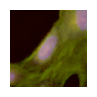

14


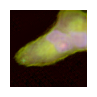

15


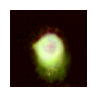

33


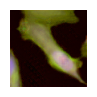

40


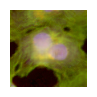

45


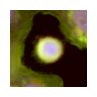

53


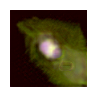

72


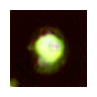

98


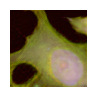

102


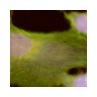

107


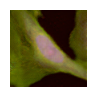

114


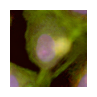

134


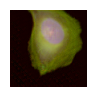

135


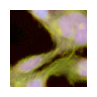

141


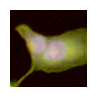

164


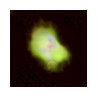

196


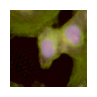

198


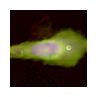

202


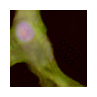

206


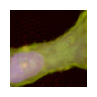

230


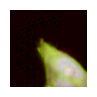

288


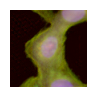

300


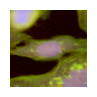

324


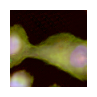

359


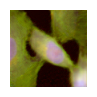

388


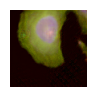

405


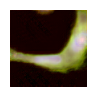

439


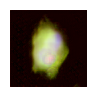

446


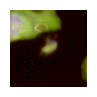

466


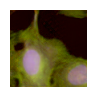

502


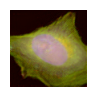

509


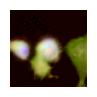

521


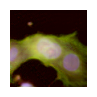

539


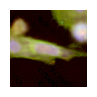

555


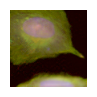

570


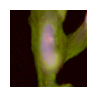

574


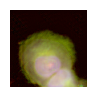

597


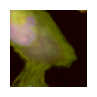

612


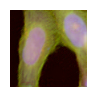

619


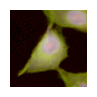

638


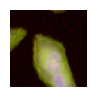

662


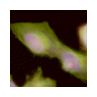

669


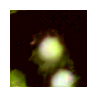

724


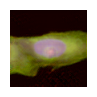

729


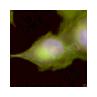

738


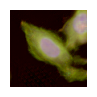

762


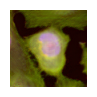

775


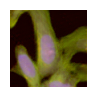

778


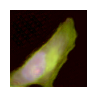

788


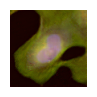

803


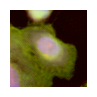

860


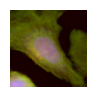

870


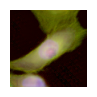

905


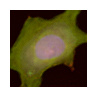

944


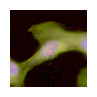

945


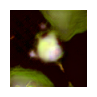

997


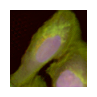

1000


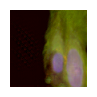

1032


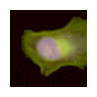

1033


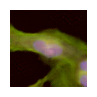

1043


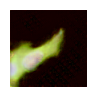

1061


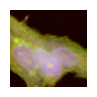

1063


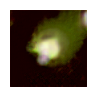

1096


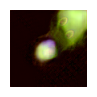

1108


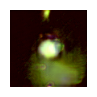

1115


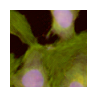

1145


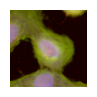

1147


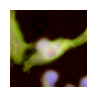

1175


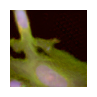

1191


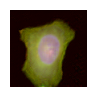

1206


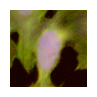

1223


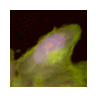

1238


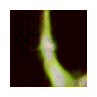

1243


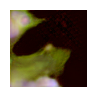

1291


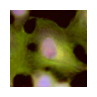

1337


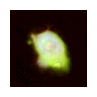

1357


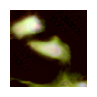

1358


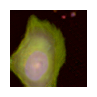

1379


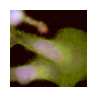

1396


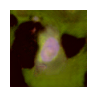

1439


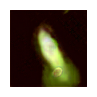

1472


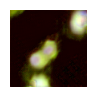

1483


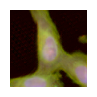

1513


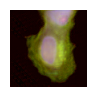

1528


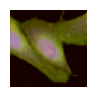

1546


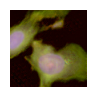

1548


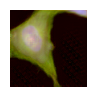

1594


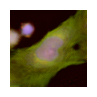

1599


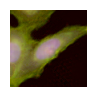

1616


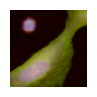

1640


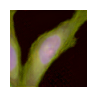

1745


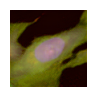

1758


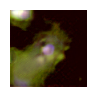

1764


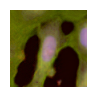

1770


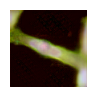

1775


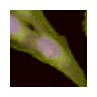

1786


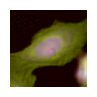

1805


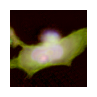

1808


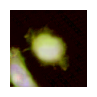

1810


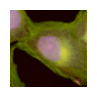

1818


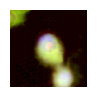

In [77]:
print_images_by_organelle(images_9, [5, 2, 0], adata_row_9)

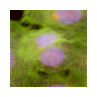

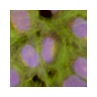

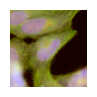

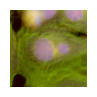

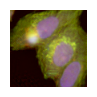

...

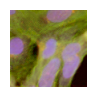

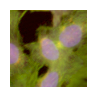

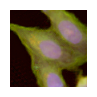

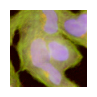

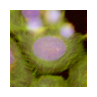

In [78]:
print_images_by_organelle(images_3, [5, 2, 0])

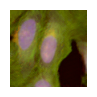

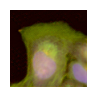

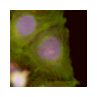

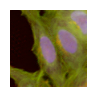

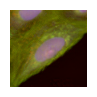

...

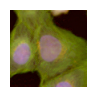

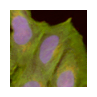

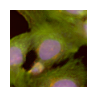

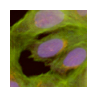

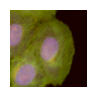

In [79]:
print_images_by_organelle(images_2, [5, 2, 0])

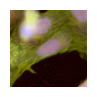

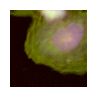

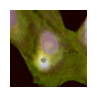

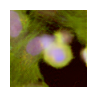

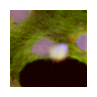

...

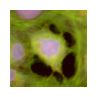

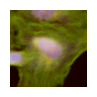

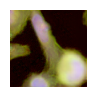

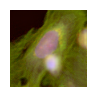

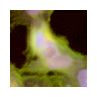

In [80]:
print_images_by_organelle(images_11, [5, 2, 0])

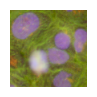

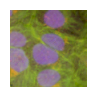

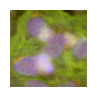

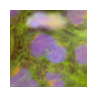

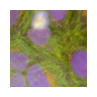

...

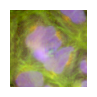

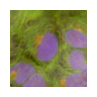

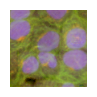

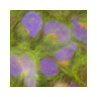

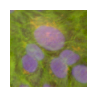

In [81]:
print_images_by_organelle(images_1, [5, 2, 0])

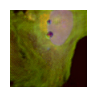

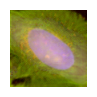

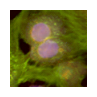

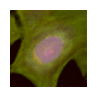

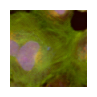

...

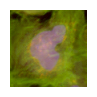

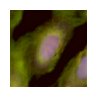

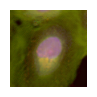

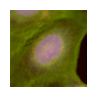

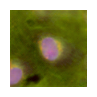

In [82]:
print_images_by_organelle(images_12, [5, 2, 0])

**Cross-plot clusters**

In [83]:
def plot_highlighted_cells(adata1, adata2, cluster_label):
    # Step 1: Identify cells belonging to the specified cluster in the first AnnData
    selected_cells_mask = adata1.obs['leiden'] == cluster_label
    selected_cells_indices = np.where(selected_cells_mask)[0]

    # Step 2: Subset the second AnnData using the selected cell indices
    highlighted_adata2 = adata2[selected_cells_indices, :]

    # Step 3: Plot all cells in grey
    plt.scatter(adata2.obsm['X_pca'][:, 0],  # assuming UMAP coordinates are available
                adata2.obsm['X_pca'][:, 1],  # assuming UMAP coordinates are available
                color='grey', alpha=0.5, label='Other cells', s=5)

    # Step 4: Plot highlighted cells in red
    plt.scatter(highlighted_adata2.obsm['X_pca'][:, 0],  # assuming UMAP coordinates are available
                highlighted_adata2.obsm['X_pca'][:, 1],  # assuming UMAP coordinates are available
                color='red', alpha=0.5, label='Highlighted cells', s=5)

    adata2_ctr = adata2[adata2.obs.compound=="UNTREATED"]
    plt.scatter(adata2_ctr.obsm['X_pca'][:, 0],  # assuming UMAP coordinates are available
                adata2_ctr.obsm['X_pca'][:, 1],  # assuming UMAP coordinates are available
                color='blue', alpha=0.5, label='Highlighted cells', s=5)

    plt.xlabel('PC 1')
    plt.ylabel('PC 2')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.title('Highlighted Cells from Cluster: ' + cluster_label)
    plt.legend()
    plt.show()

In [84]:
adata_before_correction.obs["cluster_type"] = adata_after_correction.obs.cluster_type

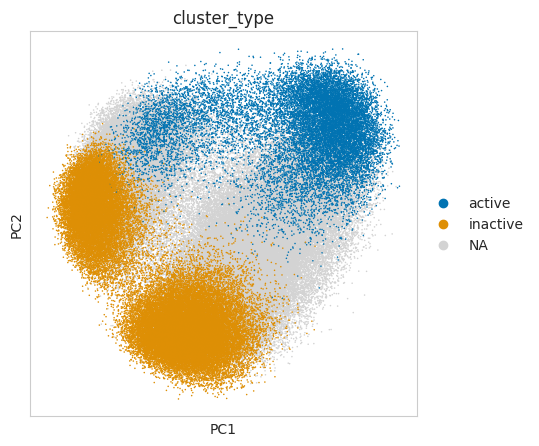

In [88]:
sc.pl.pca(adata_before_correction, color="cluster_type", groups=["active", "inactive"], s=5, 
          palette=sns.color_palette("colorblind"))

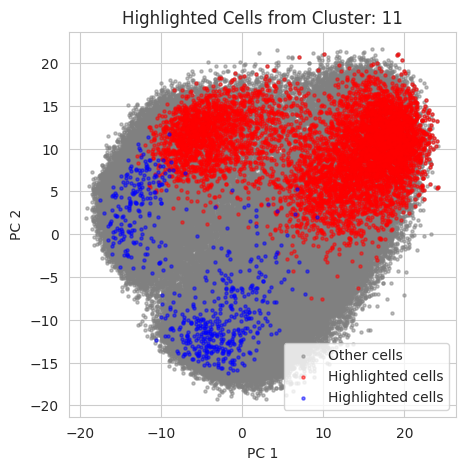

In [86]:
plot_highlighted_cells(adata_after_correction, adata_before_correction, "11")

## Final bit: check the cells in the intersecting area

In [87]:
dataset_path_uncorrected = Path("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1")

In [143]:
intereecting_region_uncorrected = plot_cluster_images(dataset_path_uncorrected, adata_before_correction, "4", n_images=100)

100it [00:06, 16.15it/s]


In [145]:
# print_images_by_organelle(intereecting_region_uncorrected, [5, 2, 0])

In [146]:
features = pd.read_csv("/lustre/groups/ml01/datasets/projects/cpg0000_alessandro/cpg0000_metadata/BR00116991/BR00116991.csv")

## Run Cellpose and measure features with scikit learn

In [147]:
from cellpose import models, utils
from skimage.feature import graycomatrix, graycoprops

Now collect the `regprops` for both the clusters 14 and 9 in the transformed cells

In [148]:
from skimage.measure import regionprops, regionprops_table

def compute_texture_features(image):
    """
    Compute texture features using GLCM (Gray-Level Co-occurrence Matrix).

    Parameters:
    - image: grayscale image.

    Returns:
    - texture_features: dictionary containing texture features.
    """
    # Compute GLCM
    distances = [1]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    glcm = graycomatrix(image, distances=distances, angles=angles, levels=256, symmetric=True, normed=True)
    
    # Compute texture properties from GLCM
    texture_props = ['contrast', 'dissimilarity', 'homogeneity', 'ASM', 'energy', 'correlation']
    texture_features = {}
    for prop in texture_props:
        texture_features[prop] = graycoprops(glcm, prop).ravel()[0]

    return texture_features

def cellpose_segmentation(images):
    """
    Perform Cellpose segmentation on a batch of images and measure all available region properties.

    Parameters:
    - images: numpy array of shape (N, H, W) containing N images.

    Returns:
    - region_props: a table of region properties for each segmented region.
    """
    # Define Cellpose model for 2D images
    model = models.Cellpose(gpu=True, model_type='cyto')  # gpu=True if you have GPU support

    region_props_res = {}
    texture_features_res = {}

    # Process each image in the batch
    for i in tqdm(range(len(images))):
        image = images[i]
        # Segment the cells
        masks, flows, styles, diams = model.eval(image, diameter=None, channels=[0, 0])
        
        # Get region properties
        props = regionprops_table(masks.astype(int), image, properties=('area', 'area_bbox', 'area_convex', 'area_filled',
                                                                'axis_major_length', 'axis_minor_length', 'bbox', 
                                                                'eccentricity', 'equivalent_diameter',
                                                                'euler_number', 'extent', 'feret_diameter_max', 
                                                                'intensity_max', 'intensity_mean', 'intensity_min', 'label', 'moments',
                                                                'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted',
                                                                'moments_weighted_central', 'moments_weighted_hu', 'moments_weighted_normalized',
                                                                 'perimeter', 'perimeter_crofton', 'solidity'))

        # Compute texture features
        texture_features = compute_texture_features(image)

        for key in props:
            if key not in region_props_res:
                region_props_res[key] = props[key]
            else:
                region_props_res[key] = np.concatenate([region_props_res[key], props[key]])

        for key in texture_features:
            if key not in texture_features_res:
                texture_features_res[key] = np.array([texture_features[key]])
            else:
                texture_features_res[key] = np.concatenate([texture_features_res[key], np.array([texture_features[key]])])
    return region_props_res, texture_features_res

In [149]:
features_9_regprops, features_9_texture = cellpose_segmentation(images_9[:,:,:,1])

 61%|██████▏   | 62/101 [01:06<00:41,  1.08s/it] 

KeyboardInterrupt



In [ ]:
features_9_regprops, features_9_texture = cellpose_segmentation(images_9[:,:,:,1])

In [ ]:
features_1_regprops, features_1_texture  = cellpose_segmentation(images_1[:,:,:,1])

In [ ]:
features_9_regprops = pd.DataFrame(features_9_regprops)
features_1_regprops = pd.DataFrame(features_1_regprops)

In [ ]:
features_9_texture = pd.DataFrame(features_9_texture)
features_1_texture = pd.DataFrame(features_1_texture)

In [ ]:
features_9_texture.mean(0)

In [ ]:
features_1_texture.mean(0)

In [ ]:
features_1_regprops.mean(0)["intensity_mean"]

In [ ]:
features_9_regprops.mean(0)["intensity_mean"]

# Check cells witg intersection in UMAP

In [151]:
# adata_before_correction_sub = adata_before_correction[adata_before_correction.obsm["X_pca"][:,0]>2]

In [152]:
dataset_path_uncorrected = Path("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1")

In [228]:
images_2_uncorrected, filenames_2_uncorrected, adata_row = plot_cluster_images(dataset_path_uncorrected,
                                                                               adata_after_correction, 
                                                                               "9",
                                                                               n_images=500)

500it [00:05, 94.58it/s] 


6


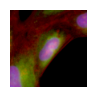

14


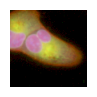

15


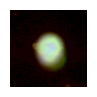

33


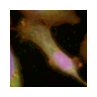

40


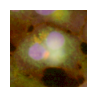

45


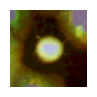

53


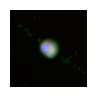

72


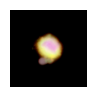

98


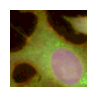

102


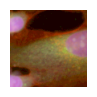

107


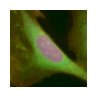

114


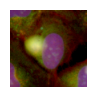

134


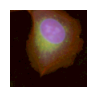

135


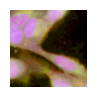

141


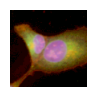

164


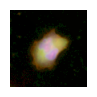

196


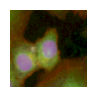

198


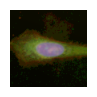

202


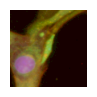

206


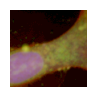

230


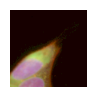

288


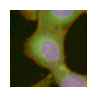

300


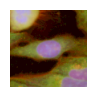

324


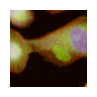

359


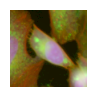

388


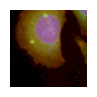

405


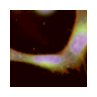

439


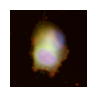

446


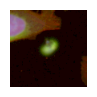

466


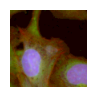

502


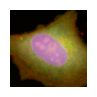

509


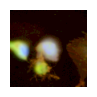

521


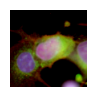

539


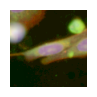

555


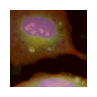

570


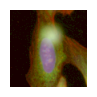

574


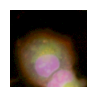

597


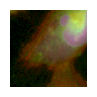

612


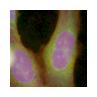

619


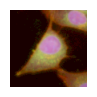

638


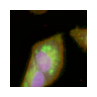

662


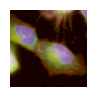

669


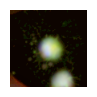

724


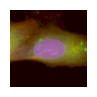

729


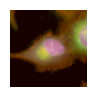

738


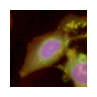

762


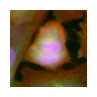

775


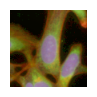

778


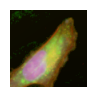

788


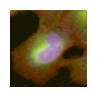

803


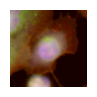

860


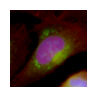

870


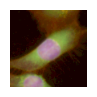

905


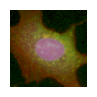

944


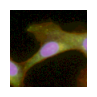

945


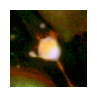

997


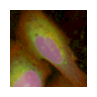

1000


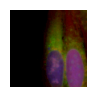

1032


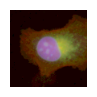

1033


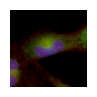

1043


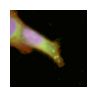

1061


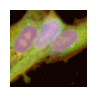

1063


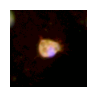

1096


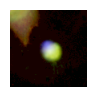

1108


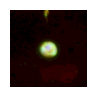

1115


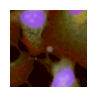

1145


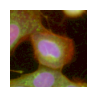

1147


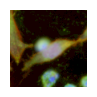

1175


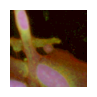

1191


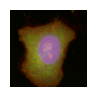

1206


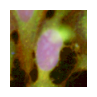

1223


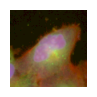

1238


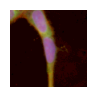

1243


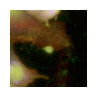

1291


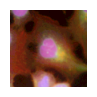

1337


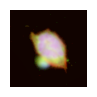

1357


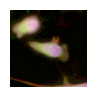

1358


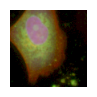

1379


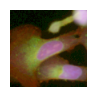

1396


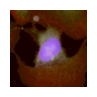

1439


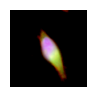

1472


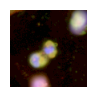

1483


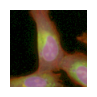

1513


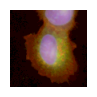

1528


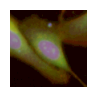

1546


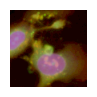

1548


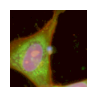

1594


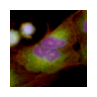

1599


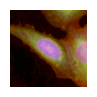

1616


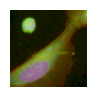

1640


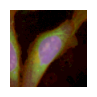

1745


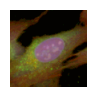

1758


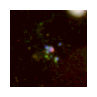

1764


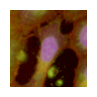

1770


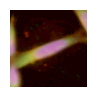

1775


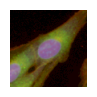

1786


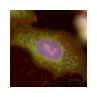

1805


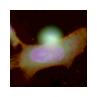

1808


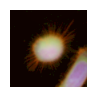

1810


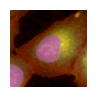

1818


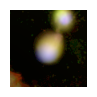

1820


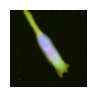

1837


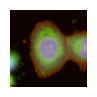

1841


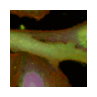

1842


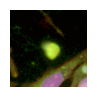

1856


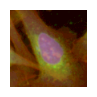

1862


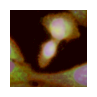

1869


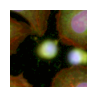

1877


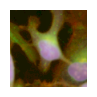

1879


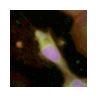

1880


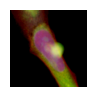

1906


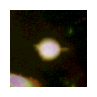

1924


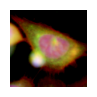

1967


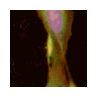

1988


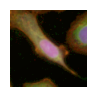

2018


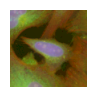

2074


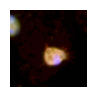

2077


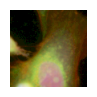

2089


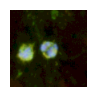

2119


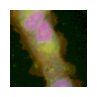

2123


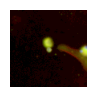

2133


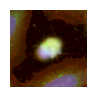

2140


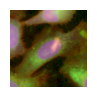

2182


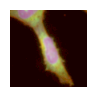

2184


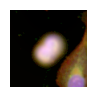

2198


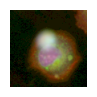

2207


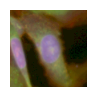

2228


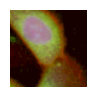

2234


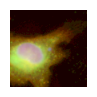

2236


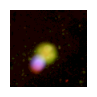

2247


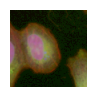

2280


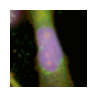

2285


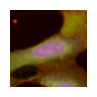

2303


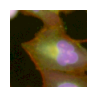

2309


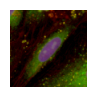

2312


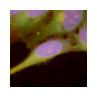

2348


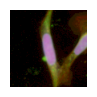

2351


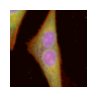

2383


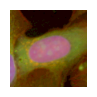

2387


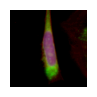

2396


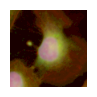

2439


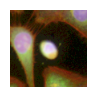

2473


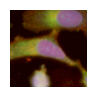

2475


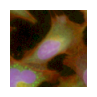

2487


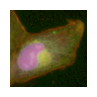

2498


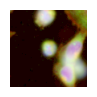

2529


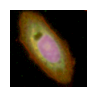

2563


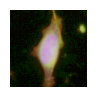

2567


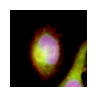

2586


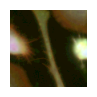

2588


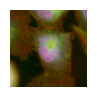

2637


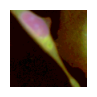

2681


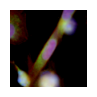

2705


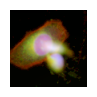

2740


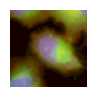

2758


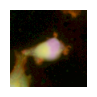

2769


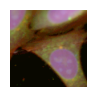

2795


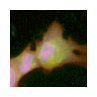

2823


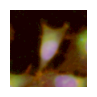

2832


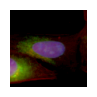

2833


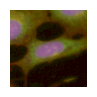

2843


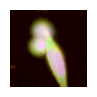

2881


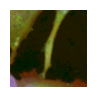

2885


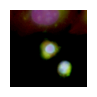

2886


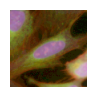

2915


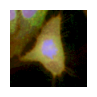

2932


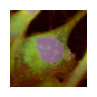

2937


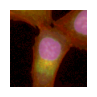

2979


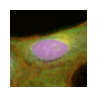

2981


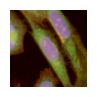

3003


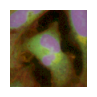

3061


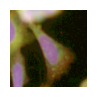

3069


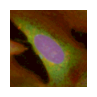

3081


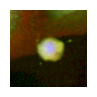

3090


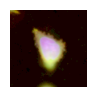

3119


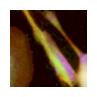

3125


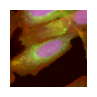

3144


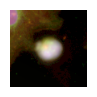

3146


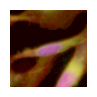

3159


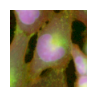

3173


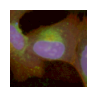

3181


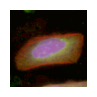

3199


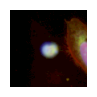

3218


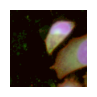

3222


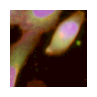

3224


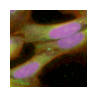

3232


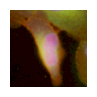

3255


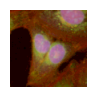

3259


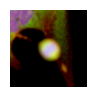

3272


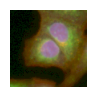

3290


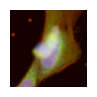

3301


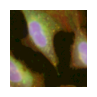

3327


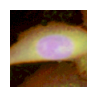

3384


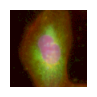

3387


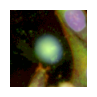

3399


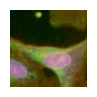

3402


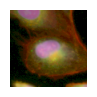

3413


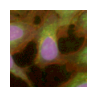

3417


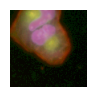

3422


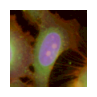

3443


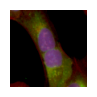

3444


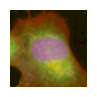

3484


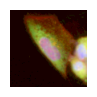

3490


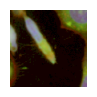

3538


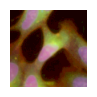

3541


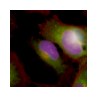

3558


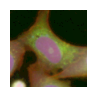

3566


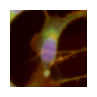

3622


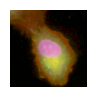

3649


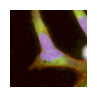

3650


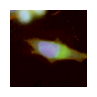

3662


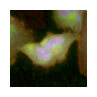

3722


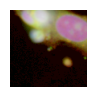

3743


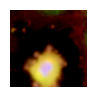

3795


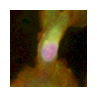

3820


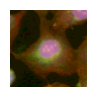

3844


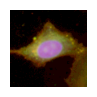

3848


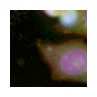

3873


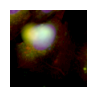

3897


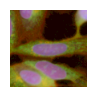

3900


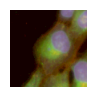

3902


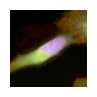

3919


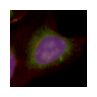

3983


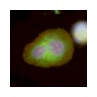

3989


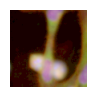

4001


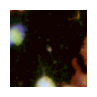

4028


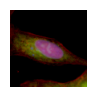

4039


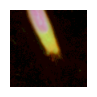

4057


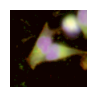

4061


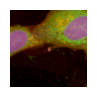

4065


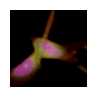

4074


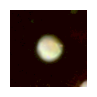

4114


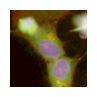

4127


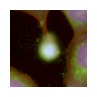

4128


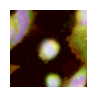

4130


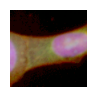

4131


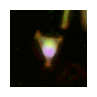

4140


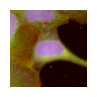

4150


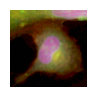

4151


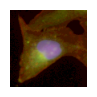

4169


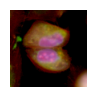

4170


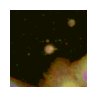

4179


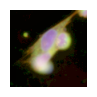

4201


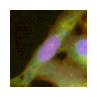

4202


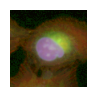

4209


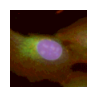

4239


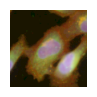

4240


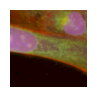

4250


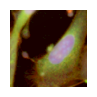

4286


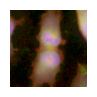

4313


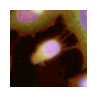

4359


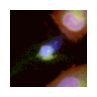

4385


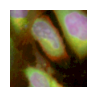

4390


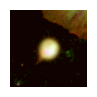

4439


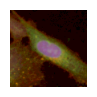

4446


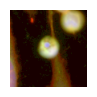

4449


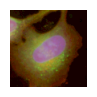

4471


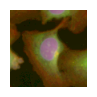

4482


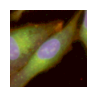

4484


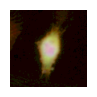

4516


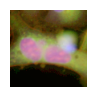

4528


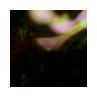

4556


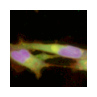

4583


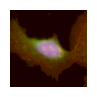

4605


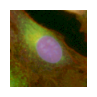

4612


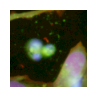

4633


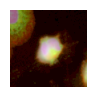

4639


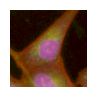

4665


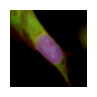

4703


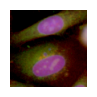

4704


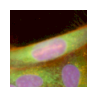

4734


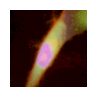

4746


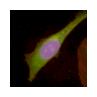

4756


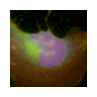

4790


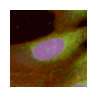

4791


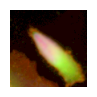

4835


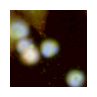

4856


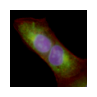

4888


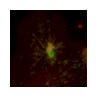

4911


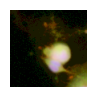

4925


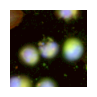

4950


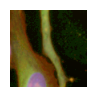

4970


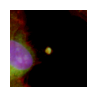

5002


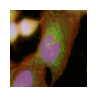

5056


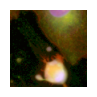

5112


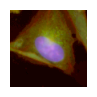

5149


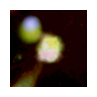

5164


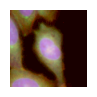

5193


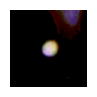

5194


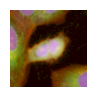

5198


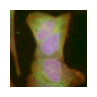

5268


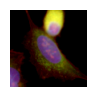

5270


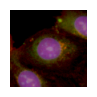

5276


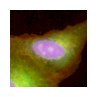

5288


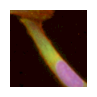

5304


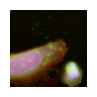

5324


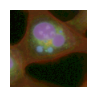

5377


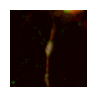

5389


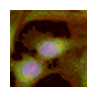

5406


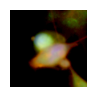

5419


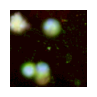

5494


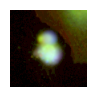

5500


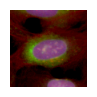

5501


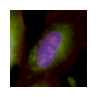

5507


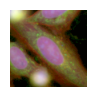

5512


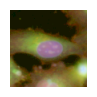

5529


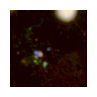

5571


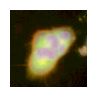

5583


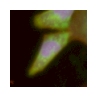

5602


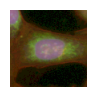

5644


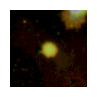

5652


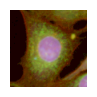

5672


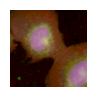

5679


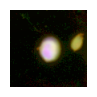

5688


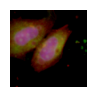

5718


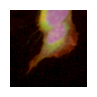

5736


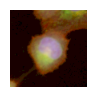

5774


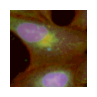

5796


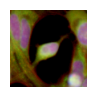

5846


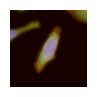

5850


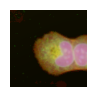

5872


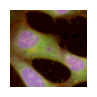

5886


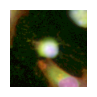

5928


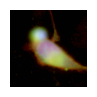

5930


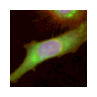

5940


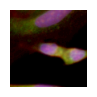

5961


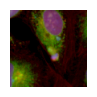

5965


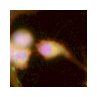

5975


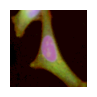

5977


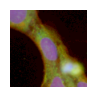

5986


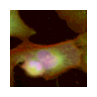

5989


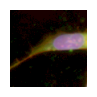

6002


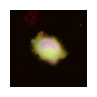

6004


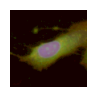

6006


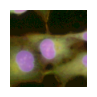

6021


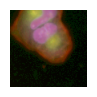

6028


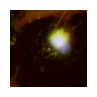

6068


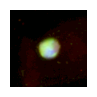

6093


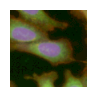

6096


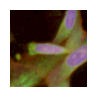

6100


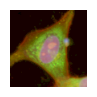

6118


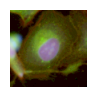

6164


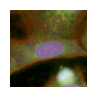

6170


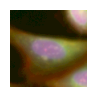

6174


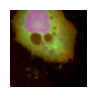

6190


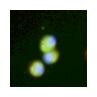

6192


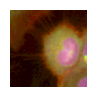

6195


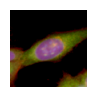

6200


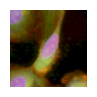

6222


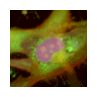

6239


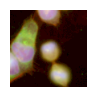

6298


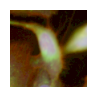

6301


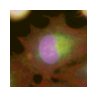

6344


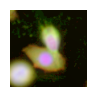

6414


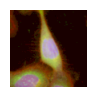

6450


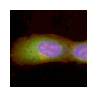

6511


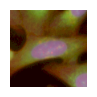

6532


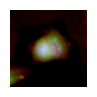

6556


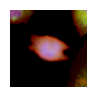

6601


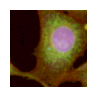

6615


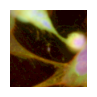

6626


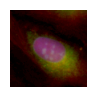

6658


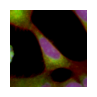

6688


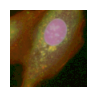

6730


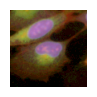

6758


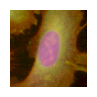

6773


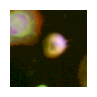

6788


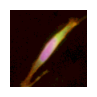

6817


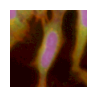

6857


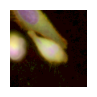

6859


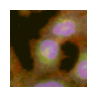

6862


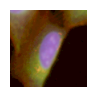

6888


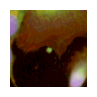

6891


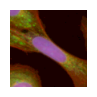

6914


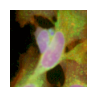

6945


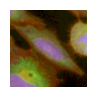

6949


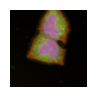

6960


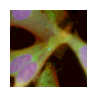

6970


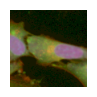

7011


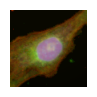

7013


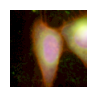

7022


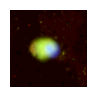

7060


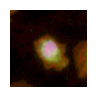

7084


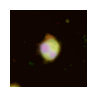

7135


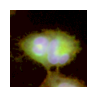

7142


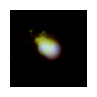

7147


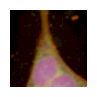

7154


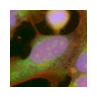

7170


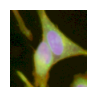

7179


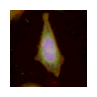

7198


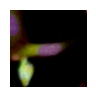

7241


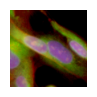

7257


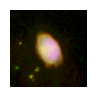

7280


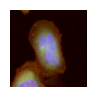

7317


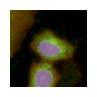

7325


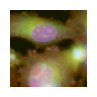

7341


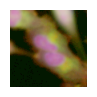

7414


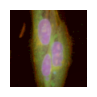

7415


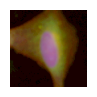

7417


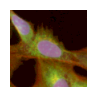

7436


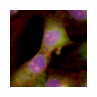

7440


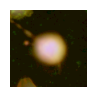

7463


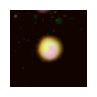

7486


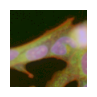

7513


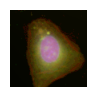

7542


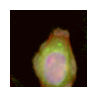

7543


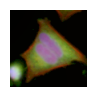

7559


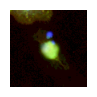

7593


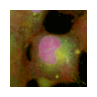

7660


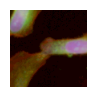

7678


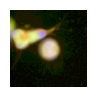

7727


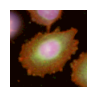

7731


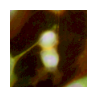

7733


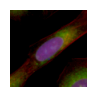

7736


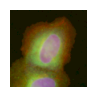

7744


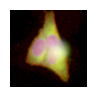

7745


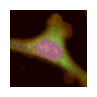

7791


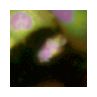

7825


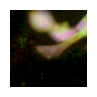

7829


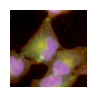

7855


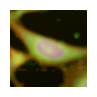

7858


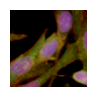

7907


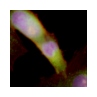

7926


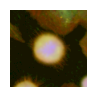

7973


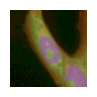

7984


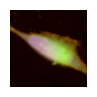

8037


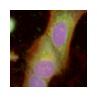

8042


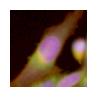

8056


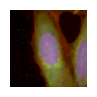

8058


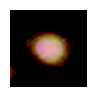

8070


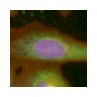

8075


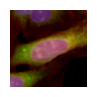

8078


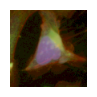

8091


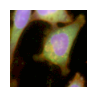

8111


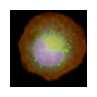

8123


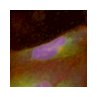

8150


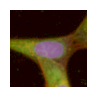

8168


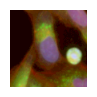

8175


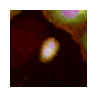

8210


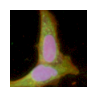

8233


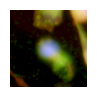

8234


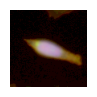

8246


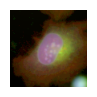

8262


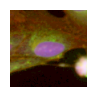

8268


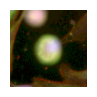

8272


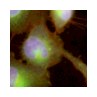

8294


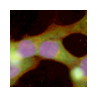

8310


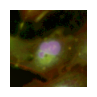

8322


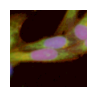

8327


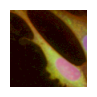

8351


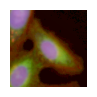

8360


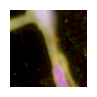

8366


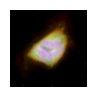

8368


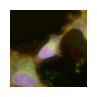

8373


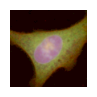

8399


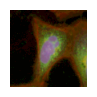

8439


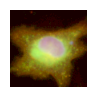

8466


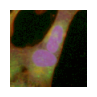

8469


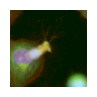

8498


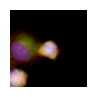

8515


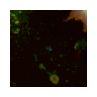

8520


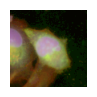

8569


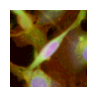

8598


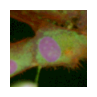

8633


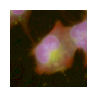

8639


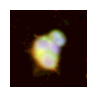

8653


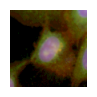

8655


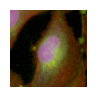

8667


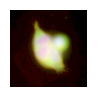

8676


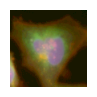

8680


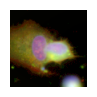

8686


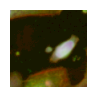

8697


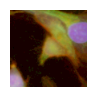

8752


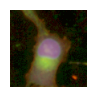

8765


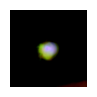

8769


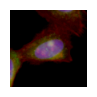

8774


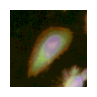

8821


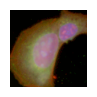

8831


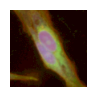

8844


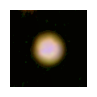

8849


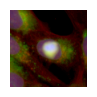

8874


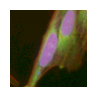

8897


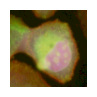

8908


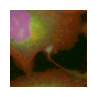

8909


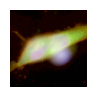

8925


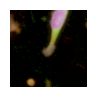

8931


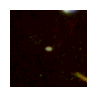

8936


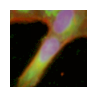

8949


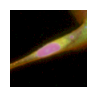

8978


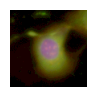

8997


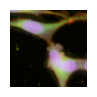

9005


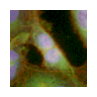

9030


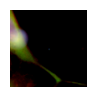

9032


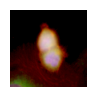

9055


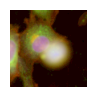

9065


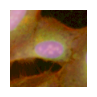

9071


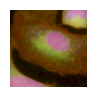

9108


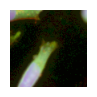

9114


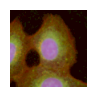

9120


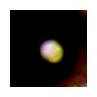

9133


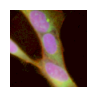

In [229]:
print_images_by_organelle(images_2_uncorrected, [5,1,0], adata_row)

6


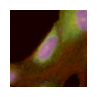

14


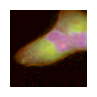

15


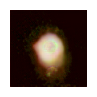

33


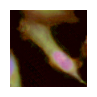

40


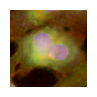

45


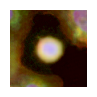

53


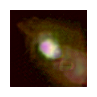

72


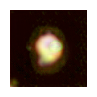

98


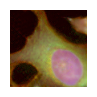

102


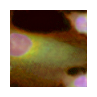

107


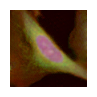

114


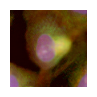

134


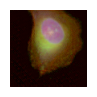

135


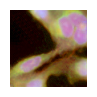

141


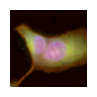

164


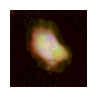

196


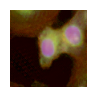

198


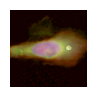

202


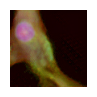

206


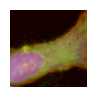

230


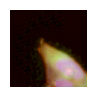

288


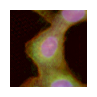

300


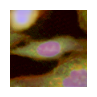

324


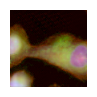

359


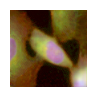

388


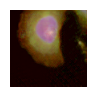

405


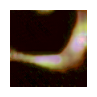

439


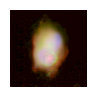

446


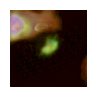

466


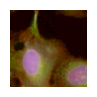

502


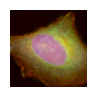

509


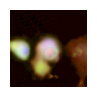

521


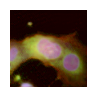

539


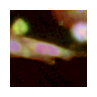

555


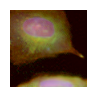

570


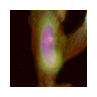

574


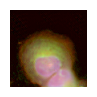

597


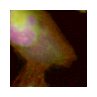

612


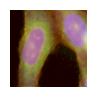

619


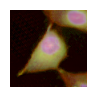

638


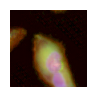

662


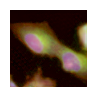

669


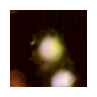

724


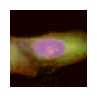

729


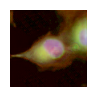

738


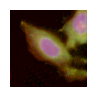

762


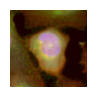

775


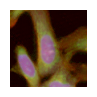

778


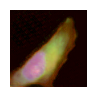

788


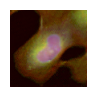

803


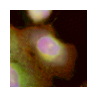

860


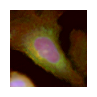

870


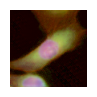

905


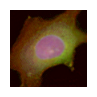

944


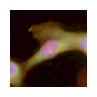

945


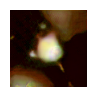

997


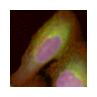

1000


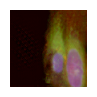

1032


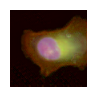

1033


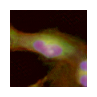

1043


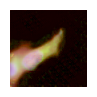

1061


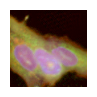

1063


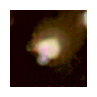

1096


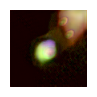

1108


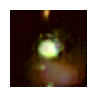

1115


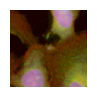

1145


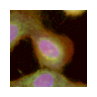

1147


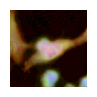

1175


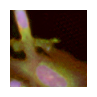

1191


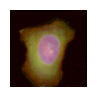

1206


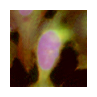

1223


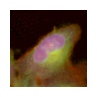

1238


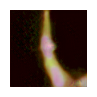

1243


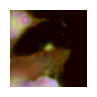

1291


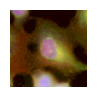

1337


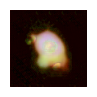

1357


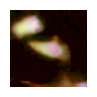

1358


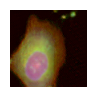

1379


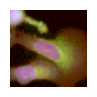

1396


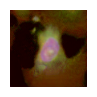

1439


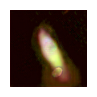

1472


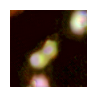

1483


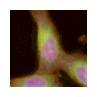

1513


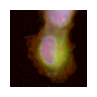

1528


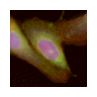

1546


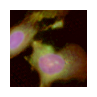

1548


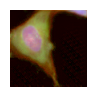

1594


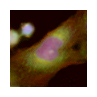

1599


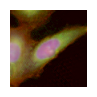

1616


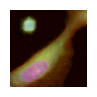

1640


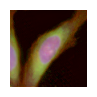

1745


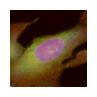

1758


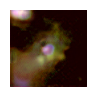

1764


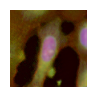

1770


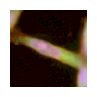

1775


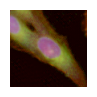

1786


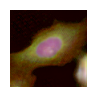

1805


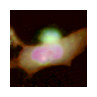

1808


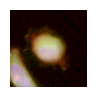

1810


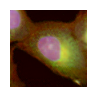

1818


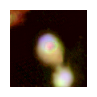

In [227]:
print_images_by_organelle(images_9, [5, 1, 0], adata_row_9)

In [ ]:
print_images_by_organelle(images_11, [5, 2, 0], adata_row_11)

In [157]:
def plot_specific_cell_umap(adata, cell_index):
    """
    Plot a specific cell in a UMAP plot and highlight it in red.

    Parameters:
        adata (anndata.AnnData): Annotated data object containing precomputed UMAP coordinates.
        cell_id (str): ID of the cell to highlight.

    Returns:
        None
    """

    # Plot UMAP
    plt.figure(figsize=(3, 3))  # Adjust figure size if needed
    plt.scatter(adata.obsm['X_pca'][:, 0], adata.obsm['X_pca'][:, 1],
                c='grey', alpha=0.5, label='Other Cells')
    
    # Highlight the specific cell in red
    for i in cell_index:
        plt.scatter(adata.obsm['X_pca'][cell_index, 0], adata.obsm['X_pca'][cell_index, 1],
                    s=100, c='red', marker='o', edgecolors='black', label=cell_index)

    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title('UMAP Plot')
    # plt.legend("off:)
    plt.show()

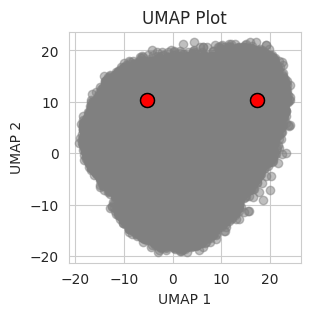

In [158]:
plot_specific_cell_umap(adata_before_correction, [200, 300])

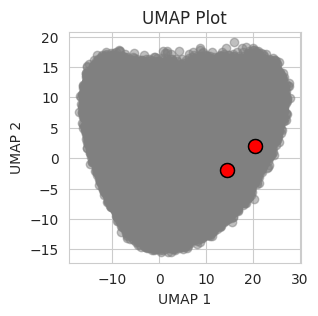

In [159]:
plot_specific_cell_umap(adata_after_correction, [200, 300])

## Measure same features uncorrected 

In [160]:
images_9_uncorrected, filenames_9_uncorrected, adata_row = plot_cluster_images(dataset_path_uncorrected,
                                                                               adata_after_correction, 
                                                                               "9")

images_1_uncorrected, filenames_1_uncorrected, adata_row = plot_cluster_images(dataset_path_uncorrected,
                                                                               adata_after_correction, 
                                                                               "1")

100it [00:04, 20.60it/s]
100it [00:04, 20.31it/s]


In [ ]:
print_images_by_organelle(images_9, [5, 2, 0], adata_row)

In [ ]:
print_images_by_organelle(images_9_uncorrected, [5, 2, 0], adata_row)

In [163]:
features_9_uncorrected_regprops, features_9_uncorrected_texture = cellpose_segmentation(images_9_uncorrected[:,:,:,1])

100%|██████████| 101/101 [00:40<00:00,  2.50it/s]


In [164]:
features_1_uncorrected_regprops, features_1_uncorrected_texture = cellpose_segmentation(images_1_uncorrected[:,:,:,1])

100%|██████████| 101/101 [00:40<00:00,  2.48it/s]


In [165]:
features_9_uncorrected_regprops, features_9_uncorrected_texture = pd.DataFrame(features_9_uncorrected_regprops), pd.DataFrame(features_9_uncorrected_texture)

In [166]:
features_1_uncorrected_regprops, features_1_uncorrected_texture = pd.DataFrame(features_1_uncorrected_regprops), pd.DataFrame(features_1_uncorrected_texture)

In [167]:
features_9_uncorrected_texture.mean(0)

contrast         73.714919
dissimilarity     4.195670
homogeneity       0.664118
ASM               0.214931
energy            0.421335
correlation       0.983142
dtype: float64

In [168]:
features_9_uncorrected_regprops.mean(0)["solidity"]

0.9225547682226203

In [169]:
features_1_uncorrected_texture.mean(0)

contrast         71.187967
dissimilarity     5.960880
homogeneity       0.297662
ASM               0.007778
energy            0.084052
correlation       0.956087
dtype: float64

In [170]:
features_1_uncorrected_regprops.mean(0)["solidity"]

0.9344282935572369